#Unidade 2
## Trabalho 3

Bibliotecas

In [ ]:
!pip install osmnx

In [ ]:
import osmnx as ox
import networkx as nx
import heapq
import matplotlib.pyplot as plt
import time

## Requisito nº 1
Escolher 10 pares (origem,destino) como pontos de interesse da cidade de Natal-RN e avaliar o algoritmo de dijkstra (networkx e min heap) comparando visualmente as soluções no OSMnx.

In [ ]:
# Baixar o grafo de Natal-RN
city = "Natal, RN, Brazil"
G = ox.graph_from_place(city, network_type='drive')  # Grafo para veículos

# Garantir que cada aresta tenha o atributo "length" (caso não exista)
for u, v, data in G.edges(data=True):
    if 'length' not in data:
        # Se o comprimento não existir, calcular a distância Euclidiana entre os dois nós
        node_u = G.nodes[u]
        node_v = G.nodes[v]
        distance = ox.distance.great_circle_vec(node_u['y'], node_u['x'], node_v['y'], node_v['x'])
        G[u][v]['length'] = distance

# Converter o grafo de OSMnx para um dicionário de adjacência
def graph_to_adjacency_dict(G):
    """Converte o grafo do OSMnx para um dicionário de adjacência para o algoritmo de Dijkstra."""
    adjacency_dict = {}
    for u, v, data in G.edges(data=True):
        # Usamos 'length' como o peso da aresta
        distance = data.get('length', 1)  # Se não houver 'length', assume-se 1 (distância padrão)

        # Se o nó de origem ainda não existir no dicionário, cria-se uma lista.
        if u not in adjacency_dict:
            adjacency_dict[u] = []
        if v not in adjacency_dict:
            adjacency_dict[v] = []

        # Adiciona a aresta ao dicionário de adjacência.
        adjacency_dict[u].append((v, distance))
        adjacency_dict[v].append((u, distance))  # Para grafos não direcionados
    return adjacency_dict

# Converte o grafo de OSMnx para um dicionário de adjacência
adj_dict = graph_to_adjacency_dict(G)

# Função Dijkstra usando NetworkX
def dijkstra_networkx(G, orig, dest):
    # Calcula o caminho mais curto usando a função de Dijkstra do NetworkX
    path = nx.shortest_path(G, source=orig, target=dest, weight='length')
    return path

# Função Dijkstra usando Min Heap
def dijkstra_minheap(G, start, end):
    """Implementação manual do Dijkstra usando min heap."""
    # Inicializar as distâncias
    distances = {node: float('inf') for node in G.nodes}
    distances[start] = 0
    prev_nodes = {node: None for node in G.nodes}
    priority_queue = [(0, start)]  # (distância, nó)

    while priority_queue:
        current_distance, current_node = heapq.heappop(priority_queue)

        if current_node == end:
            break

        # Atraso para o caso de encontrar um nó com maior distância já visitado
        if current_distance > distances[current_node]:
            continue

        for neighbor, data in G[current_node].items():
            weight = data.get('length', 1)  # Verificar se o 'length' existe
            distance = current_distance + weight

            if distance < distances[neighbor]:
                distances[neighbor] = distance
                prev_nodes[neighbor] = current_node
                heapq.heappush(priority_queue, (distance, neighbor))

    # Reconstruir o caminho
    path = []
    current_node = end
    while current_node is not None:
        path.append(current_node)
        current_node = prev_nodes[current_node]
    path.reverse()

    return path

# Exemplos de pares de origem e destino para cálculo de caminhos mais curtos
orig_dest_pairs = [
    # Ponta Negra → Shopping Midway Mall
    ((-5.884040, -35.177716), (-5.819601, -35.210341)),
    # Estádio Arena das Dunas → Parque das Dunas
    ((-5.827123, -35.208718), (-5.825248, -35.202563)),
    # Praia do Forte → Forte dos Reis Magos
    ((-5.763698, -35.202785), (-5.757727, -35.189415)),
    # UFRN - Reitoria → Shopping Via Direta
    ((-5.837086, -35.205224), (-5.846203, -35.215057)),
    # Hospital Universitário Onofre Lopes → Rodoviária de Natal
    ((-5.794664, -35.211010), (-5.808206, -35.221959)),
    # Norte Shopping → Praia de Redinha
    ((-5.735626, -35.243983), (-5.748777, -35.200329)),
    # Centro de Turismo de Natal → Shopping Midway Mall
    ((-5.793589, -35.199226), (-5.819601, -35.210341)),
    # Parque da Cidade Dom Nivaldo Monte → Estádio Arena das Dunas
    ((-5.844136, -35.231710), (-5.827123, -35.208718)),
    # Praia de Cotovelo → Praia de Ponta Negra
    ((-6.003717, -35.134396), (-5.884040, -35.177716)),
    # Shopping Cidade Jardim → UFRN - Reitoria
    ((-5.863339, -35.197974), (-5.837086, -35.205224))
]

# Função para obter o nó mais próximo de uma coordenada
def nearest_node(G, lat, lon):
    return ox.distance.nearest_nodes(G, X=lon, Y=lat)

# Convertendo coordenadas de origem e destino para nós
nodes_pairs = [(nearest_node(G, orig[0], orig[1]), nearest_node(G, dest[0], dest[1])) for orig, dest in orig_dest_pairs]

# Calcular e comparar os tempos de execução para as duas implementações de Dijkstra
for orig_node, dest_node in nodes_pairs:
    print(f"\nCalculando caminho entre {orig_node} e {dest_node}")

    # NetworkX Dijkstra
    start_time = time.time()
    path_nx = dijkstra_networkx(G, orig_node, dest_node)
    end_time = time.time()
    time_nx = end_time - start_time
    print(f"NetworkX Dijkstra: {time_nx:.4f} segundos")

    # Min Heap Dijkstra
    start_time = time.time()
    path_mh = dijkstra_minheap(G, orig_node, dest_node)
    end_time = time.time()
    time_mh = end_time - start_time
    print(f"Min Heap Dijkstra: {time_mh:.4f} segundos")


Calculando caminho entre 505055020 e 502752741
NetworkX Dijkstra: 0.0494 segundos
Min Heap Dijkstra: 0.0338 segundos

Calculando caminho entre 526590709 e 526588741
NetworkX Dijkstra: 0.0021 segundos
Min Heap Dijkstra: 0.0120 segundos

Calculando caminho entre 6993407353 e 7168038295
NetworkX Dijkstra: 0.0009 segundos
Min Heap Dijkstra: 0.0114 segundos

Calculando caminho entre 5467425830 e 526586199
NetworkX Dijkstra: 0.0044 segundos
Min Heap Dijkstra: 0.0150 segundos

Calculando caminho entre 302594926 e 3801130605
NetworkX Dijkstra: 0.0102 segundos
Min Heap Dijkstra: 0.0254 segundos

Calculando caminho entre 558387397 e 505815717
NetworkX Dijkstra: 0.0180 segundos
Min Heap Dijkstra: 0.0565 segundos

Calculando caminho entre 526598442 e 502752741
NetworkX Dijkstra: 0.0207 segundos
Min Heap Dijkstra: 0.0289 segundos

Calculando caminho entre 507033071 e 526590709
NetworkX Dijkstra: 0.0175 segundos
Min Heap Dijkstra: 0.0341 segundos

Calculando caminho entre 616061803 e 505055020
Netw

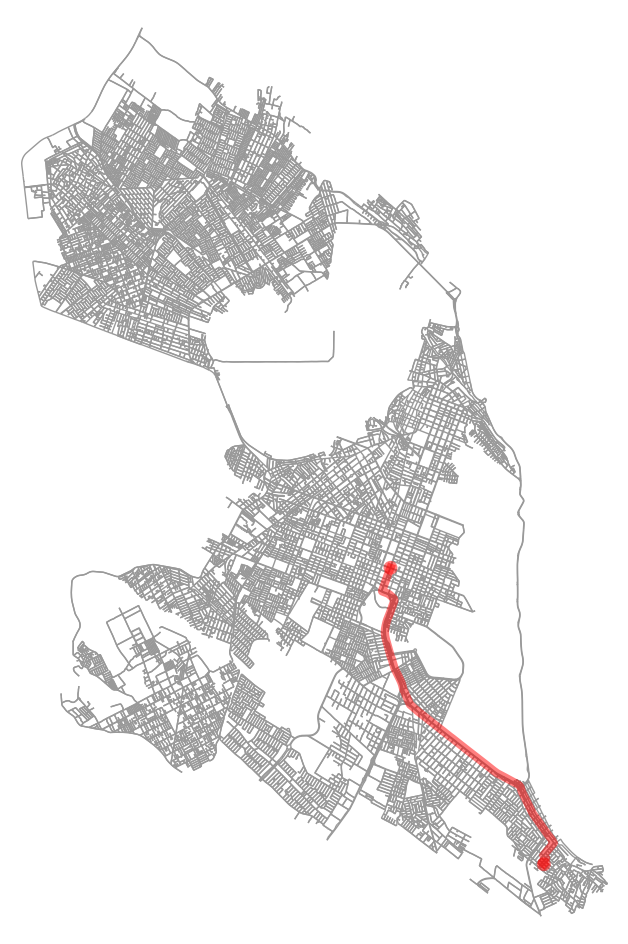

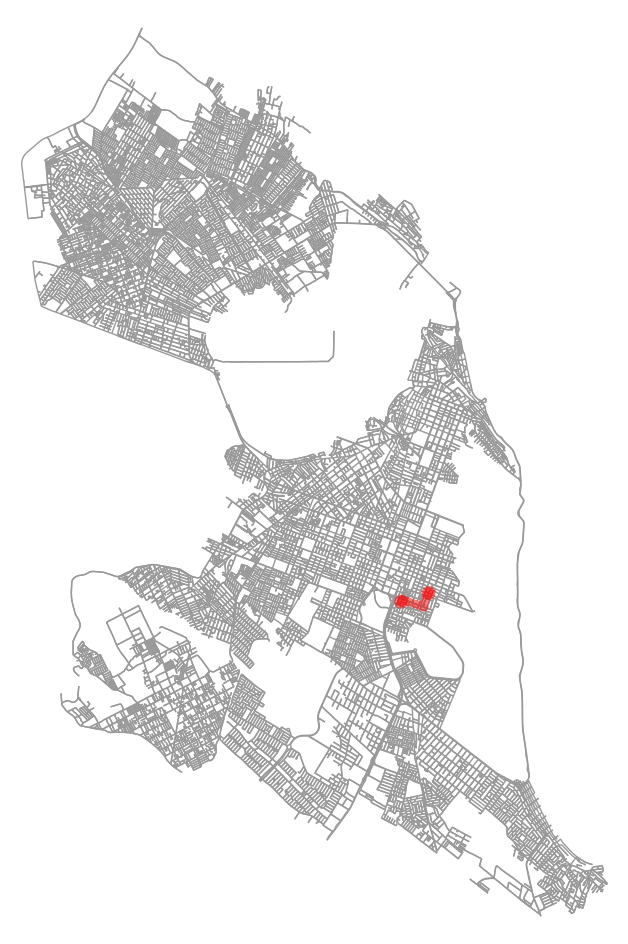

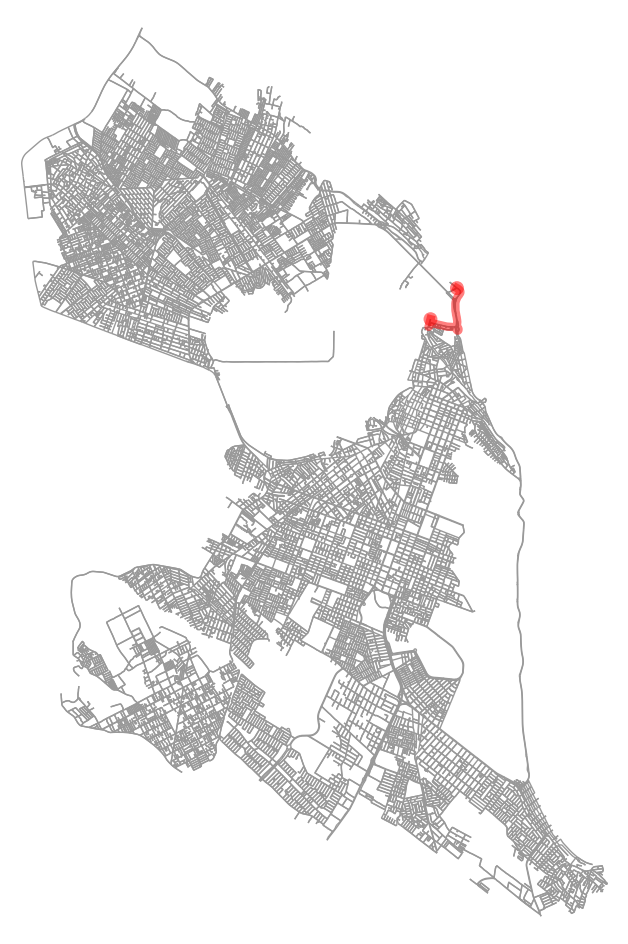

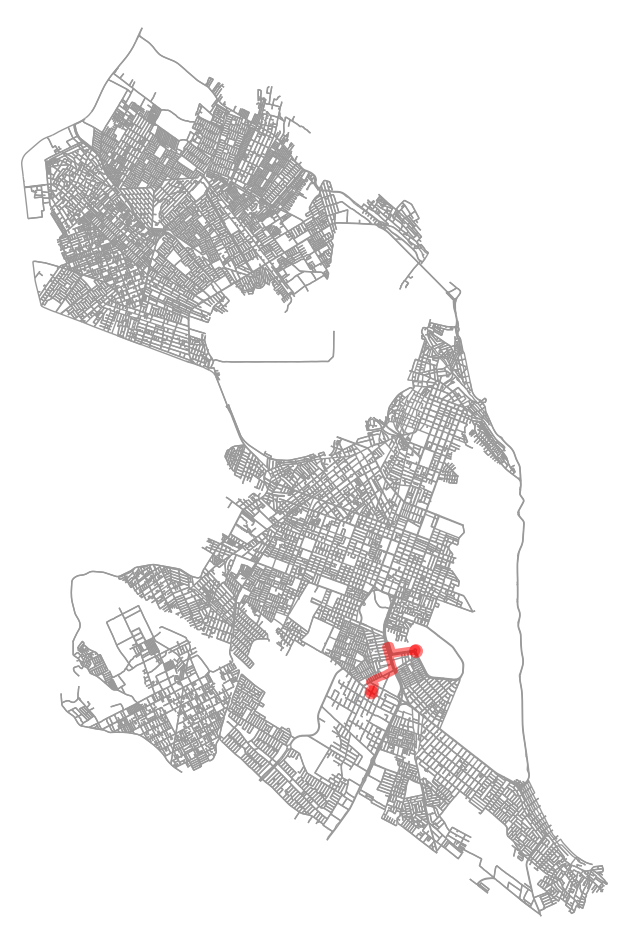

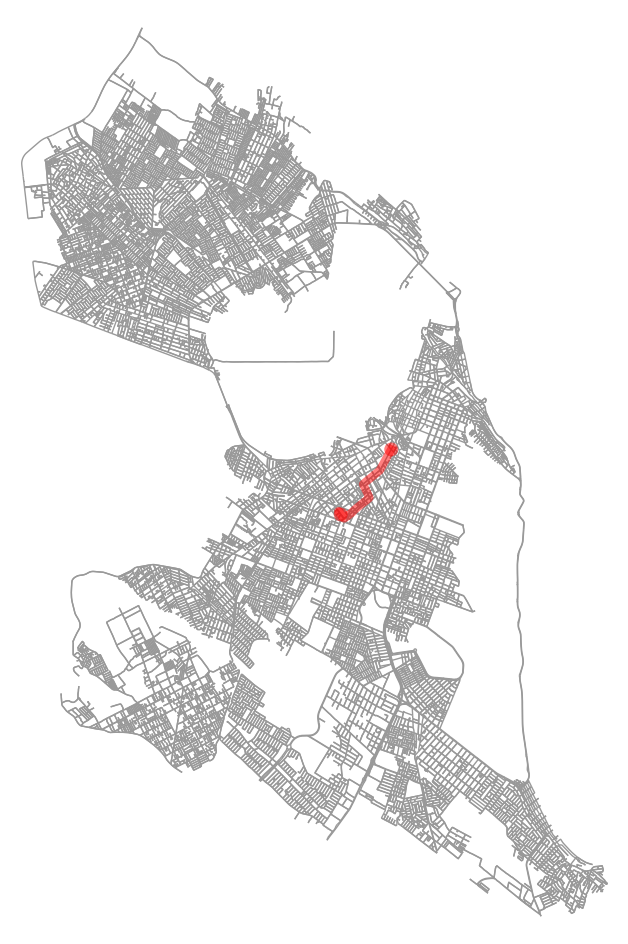

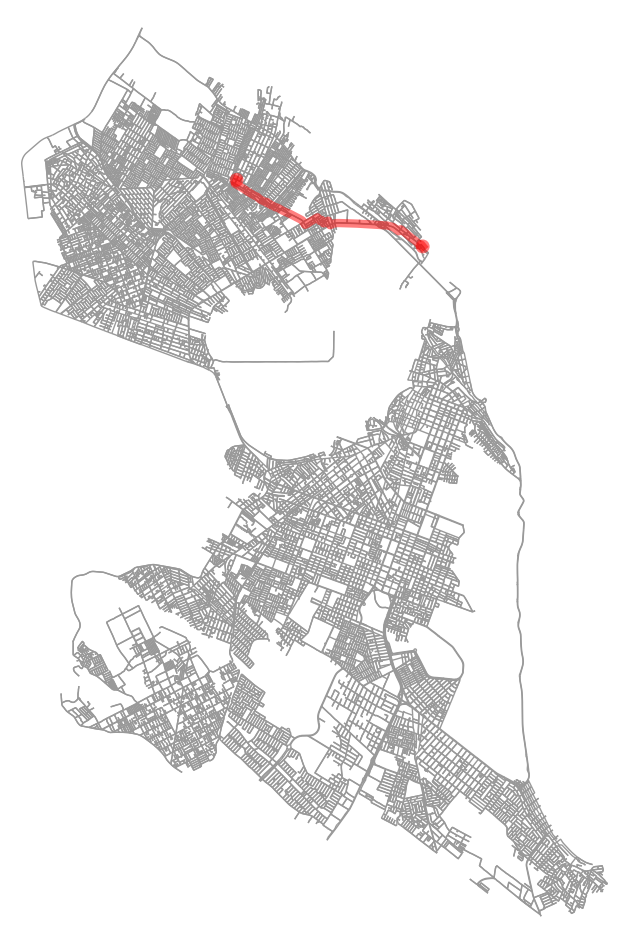

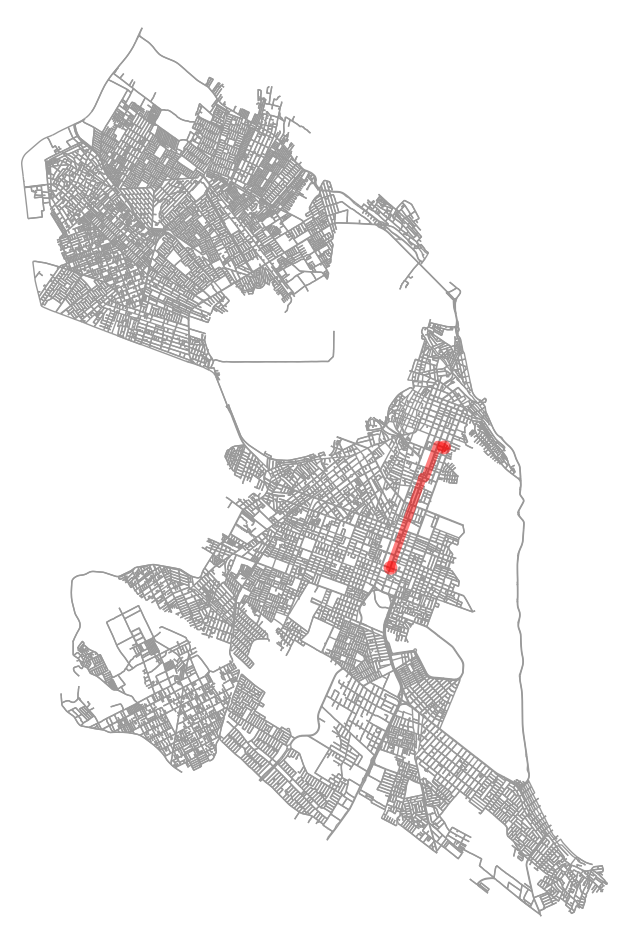

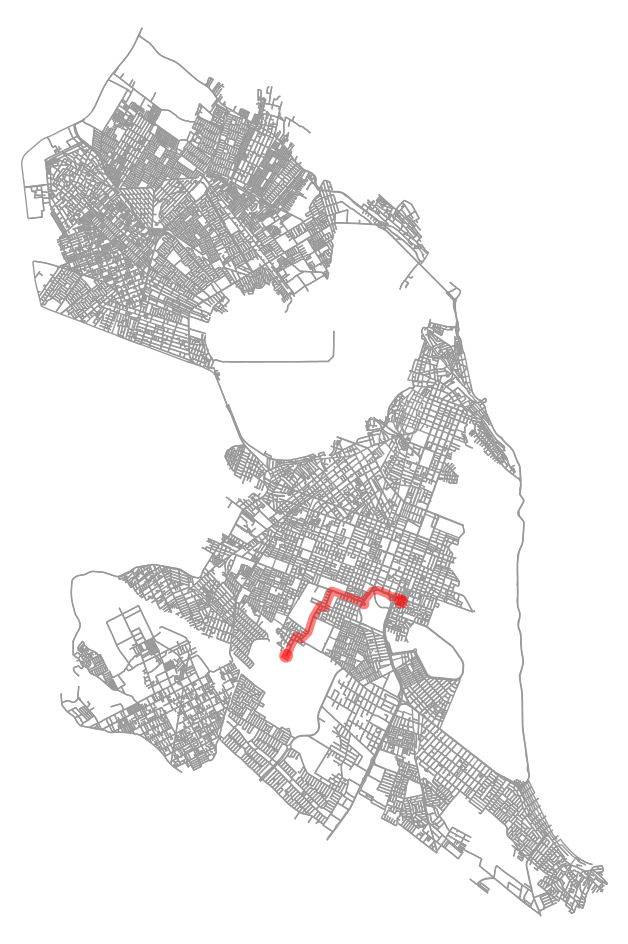

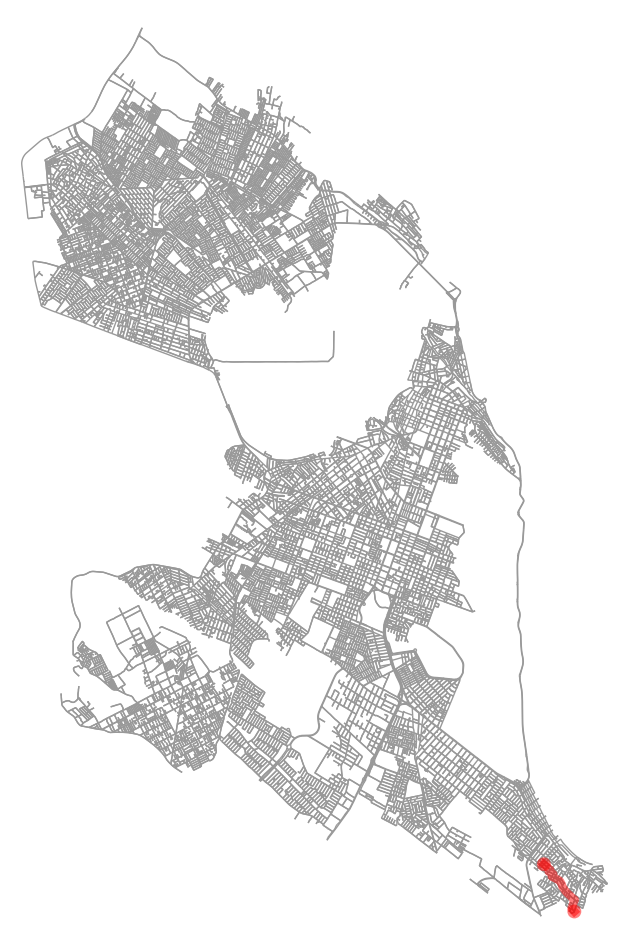

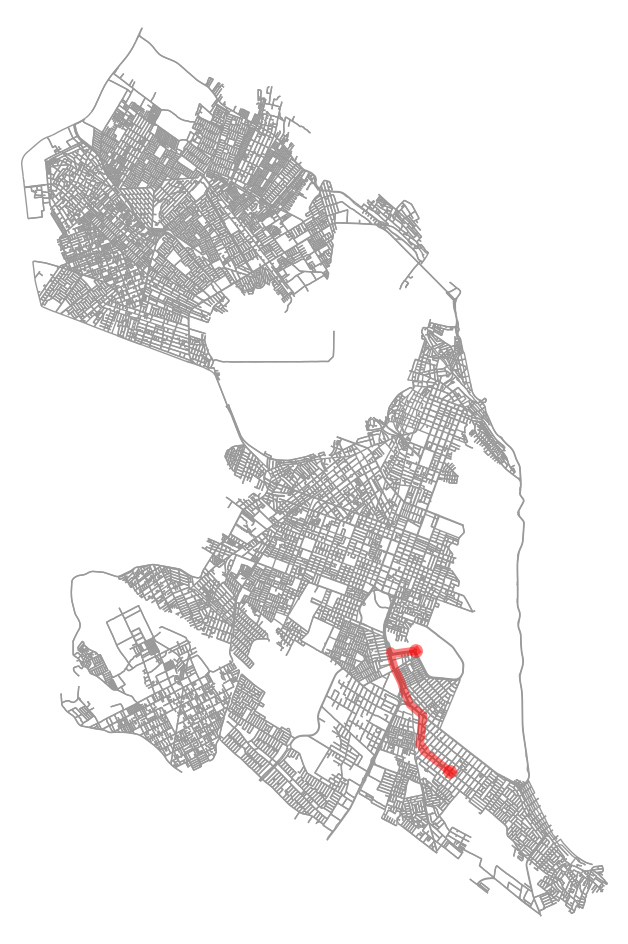

In [ ]:
# Função para garantir que ambos os caminhos (NetworkX e Min Heap) sejam corretamente calculados e plotados
def plot_paths_separately():
    for i, (orig_node, dest_node) in enumerate(nodes_pairs):
        fig, ax = plt.subplots(figsize=(12, 12))  # Novo gráfico para cada par de origem e destino
        ox.plot_graph(G, ax=ax, show=False, close=False, bgcolor='k', node_size=0)

        # Calculando o caminho usando o algoritmo de Dijkstra com NetworkX
        path_nx = dijkstra_networkx(G, orig_node, dest_node)
        if path_nx:
            ox.plot_graph_route(G, path_nx, route_linewidth=6, node_size=0, bgcolor='k', edge_color='b', ax=ax)
        else:
            print(f"Caminho NetworkX não encontrado para o par {orig_node} → {dest_node}")

        # Calculando o caminho usando o algoritmo Min Heap
        path_mh = dijkstra_minheap(G, orig_node, dest_node)
        if path_mh:
            ox.plot_graph_route(G, path_mh, route_linewidth=6, node_size=0, bgcolor='k', edge_color='r', ax=ax,alpha=0.6)
        else:
            print(f"Caminho Min Heap não encontrado para o par {orig_node} → {dest_node}")

        # Título para indicar o par de origem e destino
        ax.set_title(f'Caminho {i + 1}: {orig_node} → {dest_node}')

        # Mostrar o gráfico
        plt.show()

# Chamar a função para plotar os 10 caminhos
plot_paths_separately()

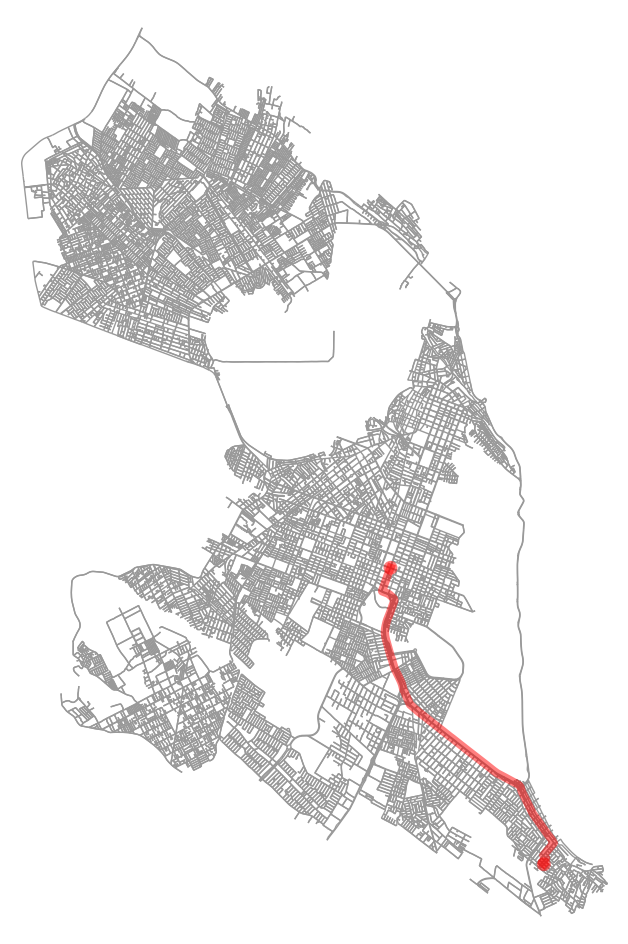

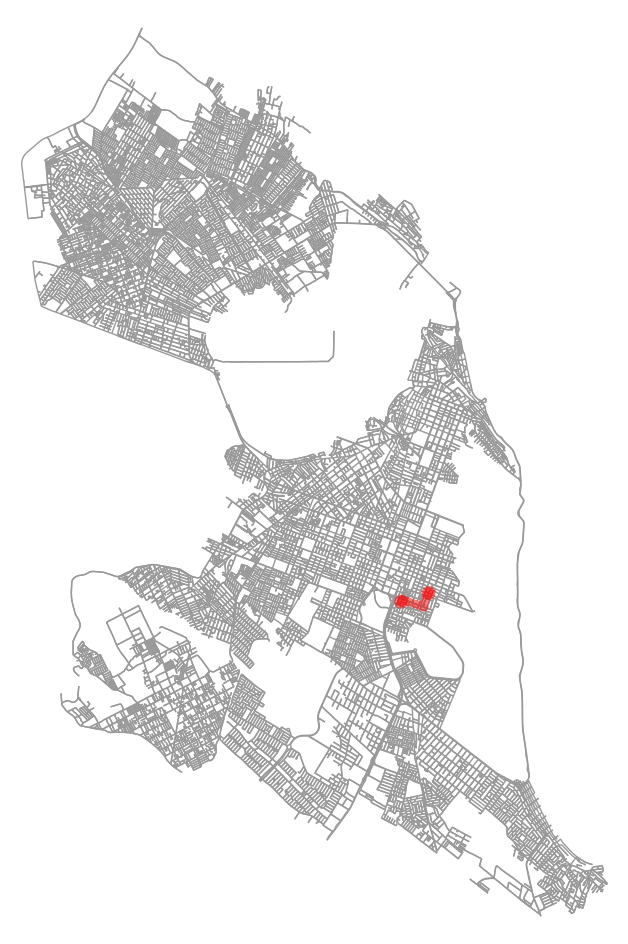

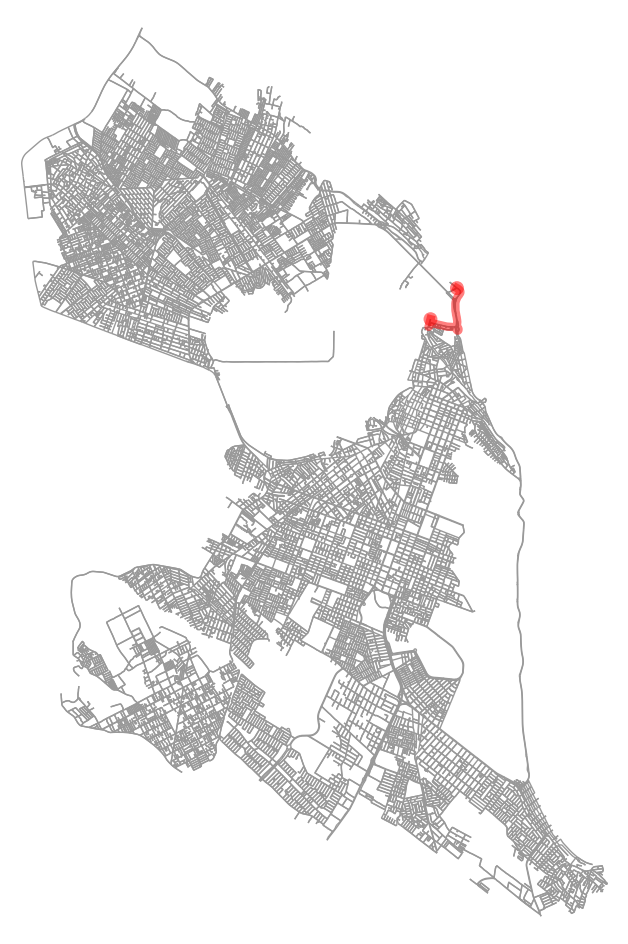

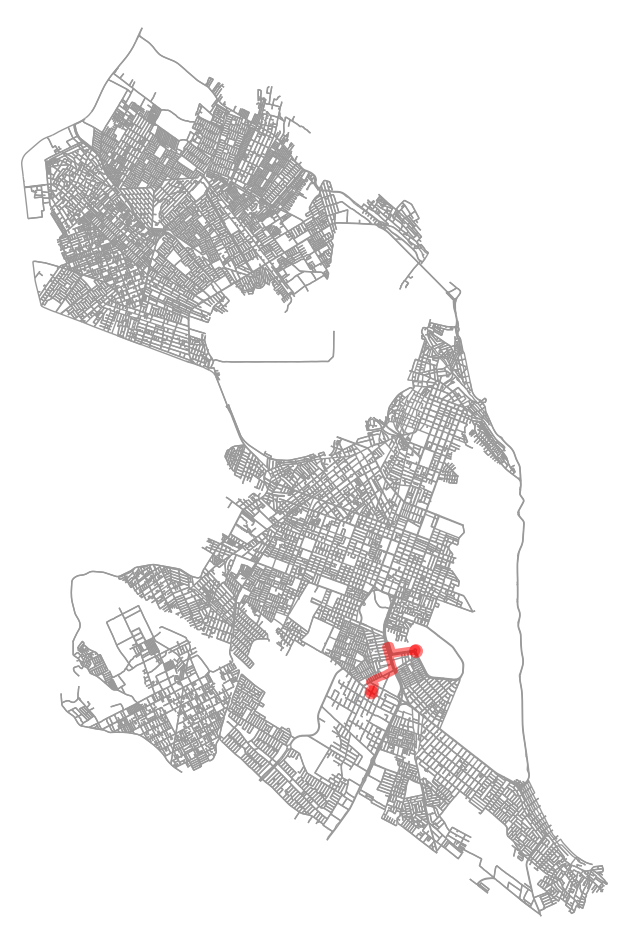

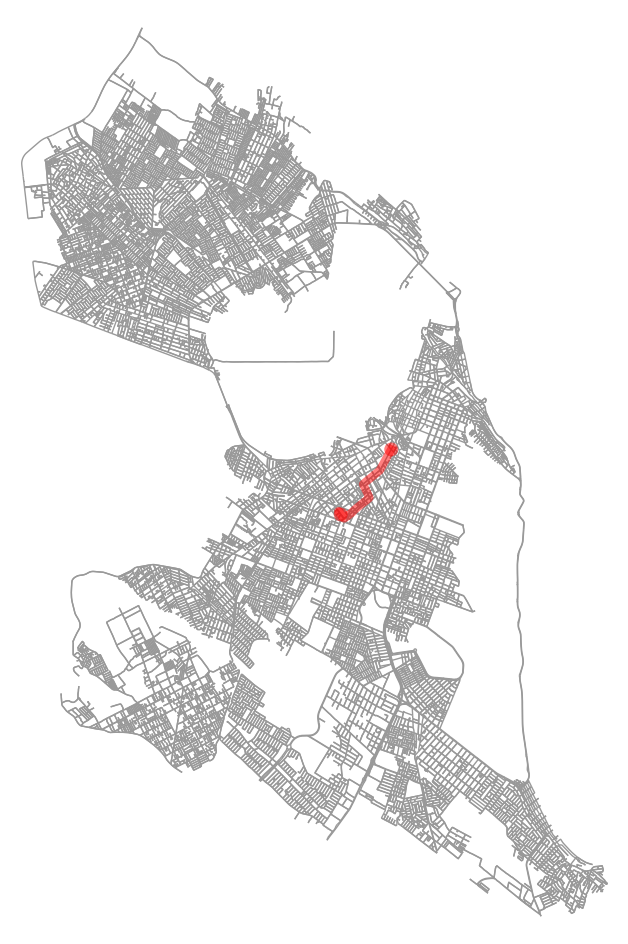

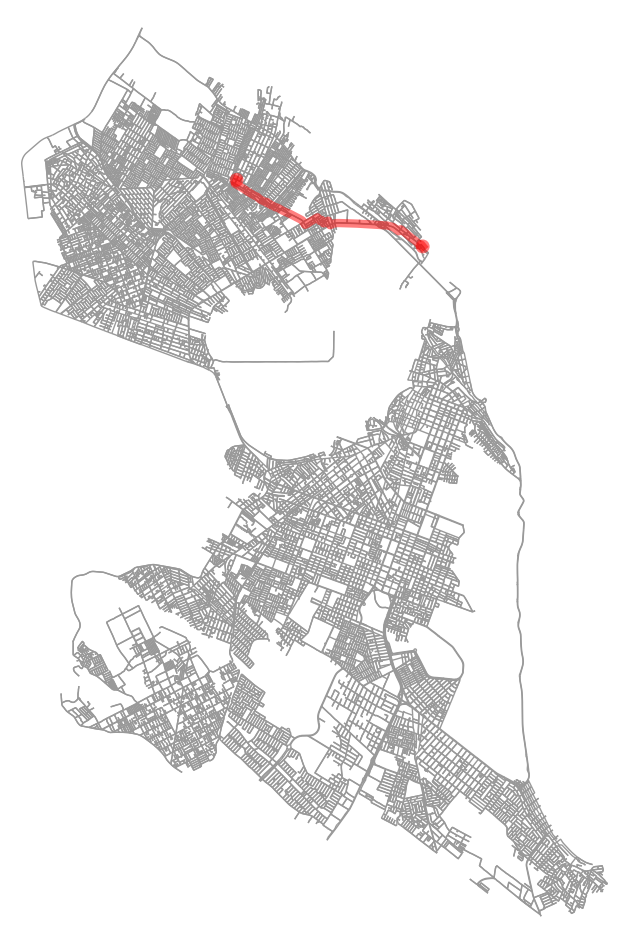

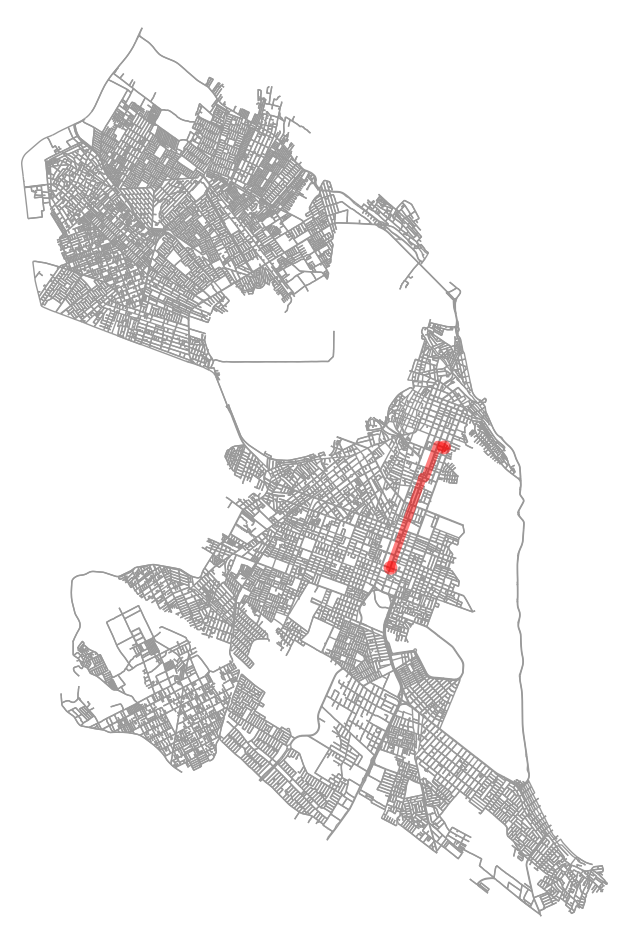

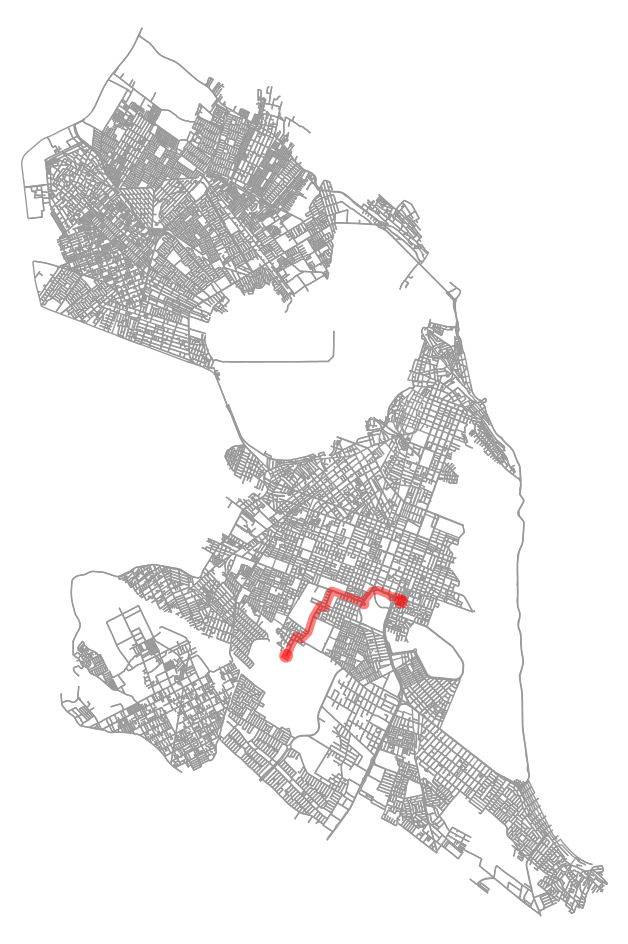

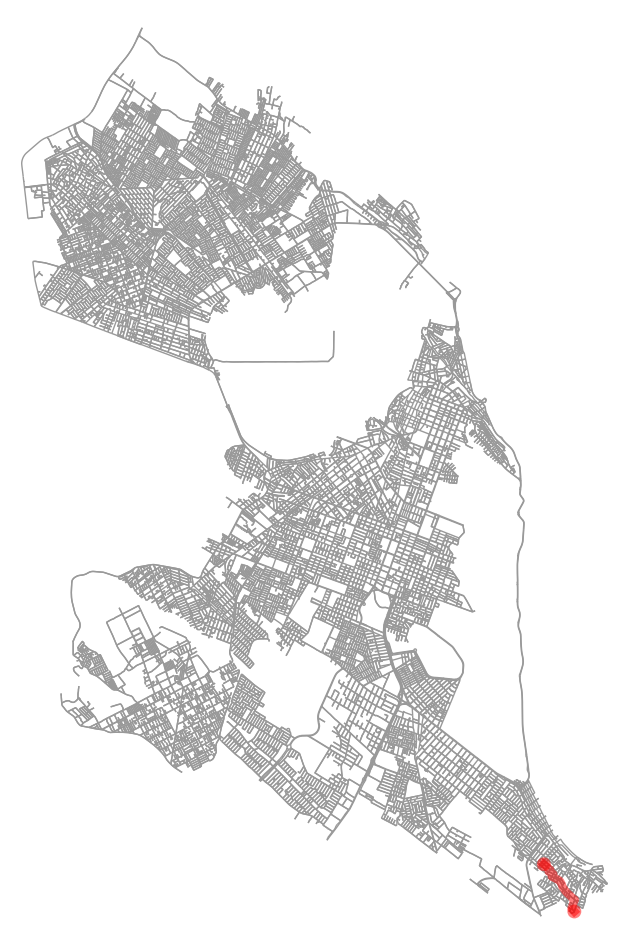

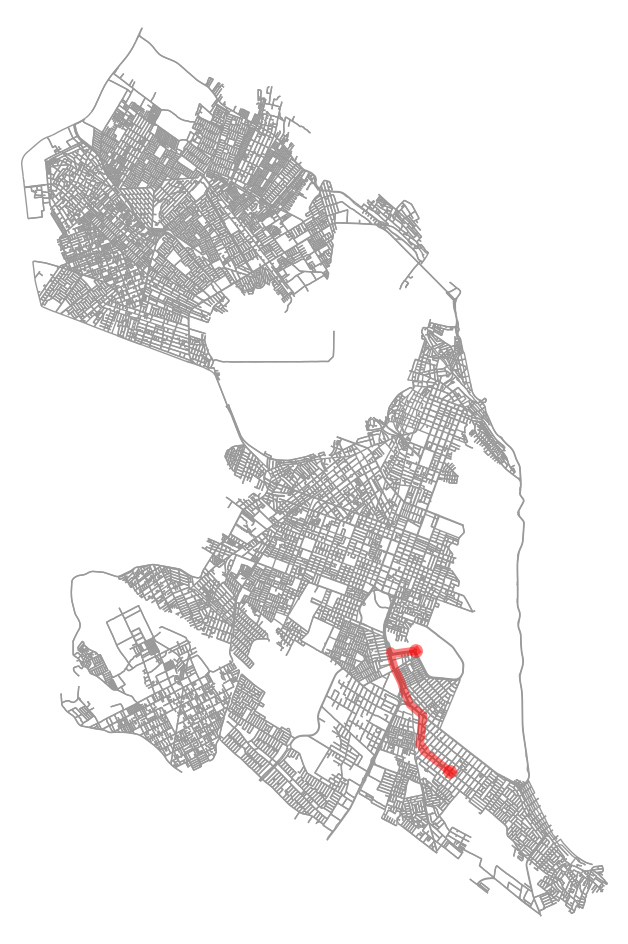

In [ ]:
# Função para garantir que ambos os caminhos (NetworkX e Min Heap) sejam corretamente calculados e plotados
def plot_paths_separately():
    for i, (orig_node, dest_node) in enumerate(nodes_pairs):
        fig, ax = plt.subplots(figsize=(12, 12))  # Novo gráfico para cada par de origem e destino
        ox.plot_graph(G, ax=ax, show=False, close=False, bgcolor='k', node_size=0)

        # Calculando o caminho usando o algoritmo de Dijkstra com NetworkX
        path_nx = dijkstra_networkx(G, orig_node, dest_node)
        if path_nx:
            ox.plot_graph_route(G, path_nx, route_linewidth=6, node_size=0, bgcolor='k', edge_color='b', ax=ax)
        else:
            print(f"Caminho NetworkX não encontrado para o par {orig_node} → {dest_node}")

        # Título para indicar o par de origem e destino
        ax.set_title(f'Caminho {i + 1}: {orig_node} → {dest_node}')

        # Mostrar o gráfico
        plt.show()

# Chamar a função para plotar os 10 caminhos
plot_paths_separately()


Comprimento total do MST para as estações de trem: 26426.955680364677 metros


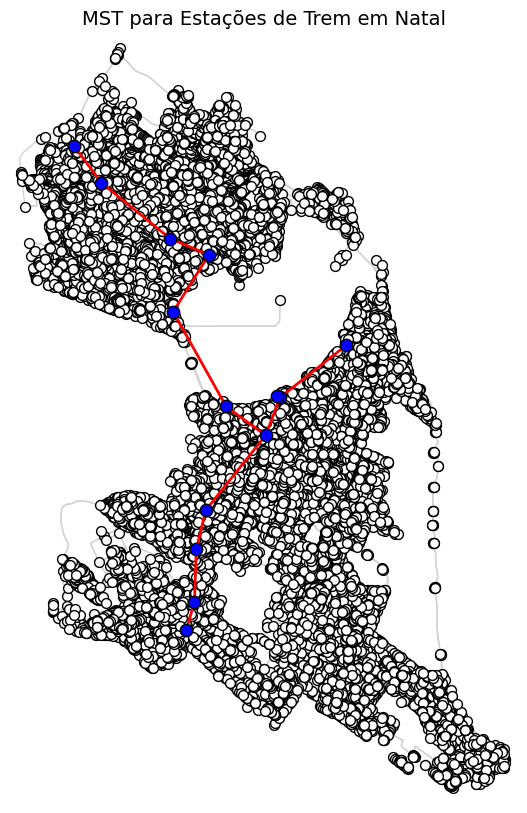

In [ ]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt

def to_undirected_multigraph(G):
    """
    Converte um MultiDiGraph direcionado em um MultiGraph não-direcionado,
    preservando atributos dos nós e arestas.
    """
    H = nx.MultiGraph()
    for n, data in G.nodes(data=True):
        H.add_node(n, **data)
    for u, v, data in G.edges(data=True):
        H.add_edge(u, v, **data)
    H.graph.update(G.graph)
    return H

# ============================================
# 1. Obter o grafo da cidade de Natal
# ============================================
place = "Natal, Rio Grande do Norte, Brazil"
G = ox.graph_from_place(place, network_type='drive')

# Converte para não-direcionado mantendo o tipo MultiGraph
G_undirected = to_undirected_multigraph(G)

# ============================================
# 2. Obter estações de trem
# ============================================
# Tags do OpenStreetMap para estações de trem
tags = {'railway': 'station'}
train_stations = ox.features.features_from_place(place, tags=tags)

# Verificar se há estações de trem
if train_stations.empty:
    raise ValueError("Nenhuma estação de trem encontrada em Natal.")

# Extrair pontos representativos (latitude e longitude)
station_points = []
for idx, row in train_stations.iterrows():
    if row.geometry.geom_type == 'Point':
        station_points.append((row.geometry.y, row.geometry.x))
    else:
        station_points.append((row.geometry.centroid.y, row.geometry.centroid.x))

# Obter nós mais próximos das estações de trem
latitudes = [sp[0] for sp in station_points]
longitudes = [sp[1] for sp in station_points]
station_nodes = ox.distance.nearest_nodes(G_undirected, X=longitudes, Y=latitudes)

# Remover duplicatas (se houver)
station_nodes = list(set(station_nodes))

# ============================================
# 3. Construir grafo completo com distâncias mínimas entre estações
# ============================================
G_train = nx.Graph()
for i in range(len(station_nodes)):
    for j in range(i + 1, len(station_nodes)):
        route = nx.shortest_path(G_undirected, station_nodes[i], station_nodes[j], weight='length')
        route_length = 0
        for k in range(len(route) - 1):
            route_length += G_undirected[route[k]][route[k + 1]][0]['length']
        G_train.add_edge(station_nodes[i], station_nodes[j], weight=route_length)

# ============================================
# 4. Calcular o MST usando o Algoritmo de Kruskal
# ============================================
mst_edges = list(nx.minimum_spanning_edges(G_train, data=True))
total_mst_length = sum([d['weight'] for (u, v, d) in mst_edges])
print("Comprimento total do MST para as estações de trem:", total_mst_length, "metros")

# ============================================
# 5. Plotar o grafo e as conexões do MST
# ============================================
# Plotar o grafo base
fig, ax = ox.plot_graph(
    G_undirected,
    show=False,
    close=False,
    node_color='white',
    node_edgecolor='black',
    node_size=50,
    edge_color='lightgray',
    edge_linewidth=1,
    bgcolor='white',    # fundo branco
    figsize=(10, 10)
)

# Destacar as rotas do MST em vermelho
for u, v, data in mst_edges:
    # Obter coordenadas dos nós u e v
    x = [G_undirected.nodes[u]['x'], G_undirected.nodes[v]['x']]
    y = [G_undirected.nodes[u]['y'], G_undirected.nodes[v]['y']]
    ax.plot(x, y, color='red', linewidth=2, zorder=4)

# Plotar as estações de trem em azul
station_x = [G_undirected.nodes[n]['x'] for n in station_nodes]
station_y = [G_undirected.nodes[n]['y'] for n in station_nodes]
ax.scatter(station_x, station_y, c='blue', s=80, zorder=5, edgecolor='black')

plt.title("MST para Estações de Trem em Natal", fontsize=14)
plt.show()
